## 1 Исследовательский анализ данных

Наш датасет содержит экспертные и краудсорсинговые оценки соответствия текста и изображения.

В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки от трёх специалистов. Для решения задачи вы должны эти оценки агрегировать — превратить в одну. Существует несколько способов агрегации оценок, самый простой — голосование большинства: за какую оценку проголосовала большая часть экспертов (в нашем случае 2 или 3), та оценка и ставится как итоговая. Поскольку число экспертов меньше числа классов, может случиться, что каждый эксперт поставит разные оценки, например: 1, 4, 2. В таком случае данную пару изображение-текст можно исключить из датасета.

В файле с краудсорсинговыми оценками информация расположена в таком порядке:

1. Доля исполнителей, подтвердивших, что текст **соответствует** картинке.
2. Количество исполнителей, подтвердивших, что текст **соответствует** картинке.
3. Количество исполнителей, подтвердивших, что текст **не соответствует** картинке.


In [ ]:
!pip install -q --upgrade keras-nlp tensorflow

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import nltk
import re
from nltk.corpus import stopwords
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('omw-1.4')

from PIL import Image
from pathlib import Path
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from tensorflow.keras.layers import (Dense, GlobalAveragePooling2D, Flatten, Dropout, BatchNormalization)
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet import ResNet50
from tensorflow import keras
import tensorflow as tf
import keras_nlp
from tqdm import notebook

from sklearn.model_selection import GroupShuffleSplit, GridSearchCV, cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler


#prevent SettingWithCopyWarning message from appearing
pd.options.mode.chained_assignment = None

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


In [ ]:
#Импорт датасетов
PATH = '/content/drive/MyDrive/to_upload'

df_train = pd.read_csv(Path(PATH,'train_dataset.csv'))
df_crowd = pd.read_csv(Path(PATH,'CrowdAnnotations.tsv'),sep='\t',names=['image', 'query_id', 'share_pos', 'count_pos', 'count_neg'])
df_expert = pd.read_csv(Path(PATH, 'ExpertAnnotations.tsv'),sep='\t',names=['image', 'query_id', '1', '1.1', '1.2'])
df_queries = pd.read_csv(Path(PATH, 'test_queries.csv'),sep='|',index_col=[0])
df_images = pd.read_csv(Path(PATH, 'test_images.csv'),sep='|')

In [ ]:
display(df_train.head())
df_train.info()

,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB


In [ ]:
display(df_crowd.head())
df_crowd.info()

,image,query_id,share_pos,count_pos,count_neg
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,0,3


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   image      47830 non-null  object 
 1   query_id   47830 non-null  object 
 2   share_pos  47830 non-null  float64
 3   count_pos  47830 non-null  int64  
 4   count_neg  47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB


In [ ]:
display(df_expert.head())
df_expert.info()

,image,query_id,1,1.1,1.2
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image     5822 non-null   object
 1   query_id  5822 non-null   object
 2   1         5822 non-null   int64 
 3   1.1       5822 non-null   int64 
 4   1.2       5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.5+ KB


In [ ]:
display(df_queries.head())
df_queries.info()

,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg


<class 'pandas.core.frame.DataFrame'>
Int64Index: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 15.6+ KB


In [ ]:
display(df_images.head())
df_images.info()

,image
0,3356748019_2251399314.jpg
1,2887171449_f54a2b9f39.jpg
2,3089107423_81a24eaf18.jpg
3,1429546659_44cb09cbe2.jpg
4,1177994172_10d143cb8d.jpg


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   100 non-null    object
dtypes: object(1)
memory usage: 928.0+ bytes


Исходя из полученной выше информации мы видим, что пропусков в таблицах нет

In [ ]:
# Проверка уникальных значений фото в обучении и тесте
print(len(df_train['image'].unique()))
print(len(df_queries['image'].unique()))

1000
100


In [ ]:
# Проверка у всех ли картинок есть описание
df_queries[df_queries['query_id'].str[:-2] != df_queries['image']].shape[0]

0

Мы видим что в обучающем наборе у нас 1000 картинок, а в тестовом 100, что является довольно малым количеством. При этом также можем заметить, что для всех картинок есть описание

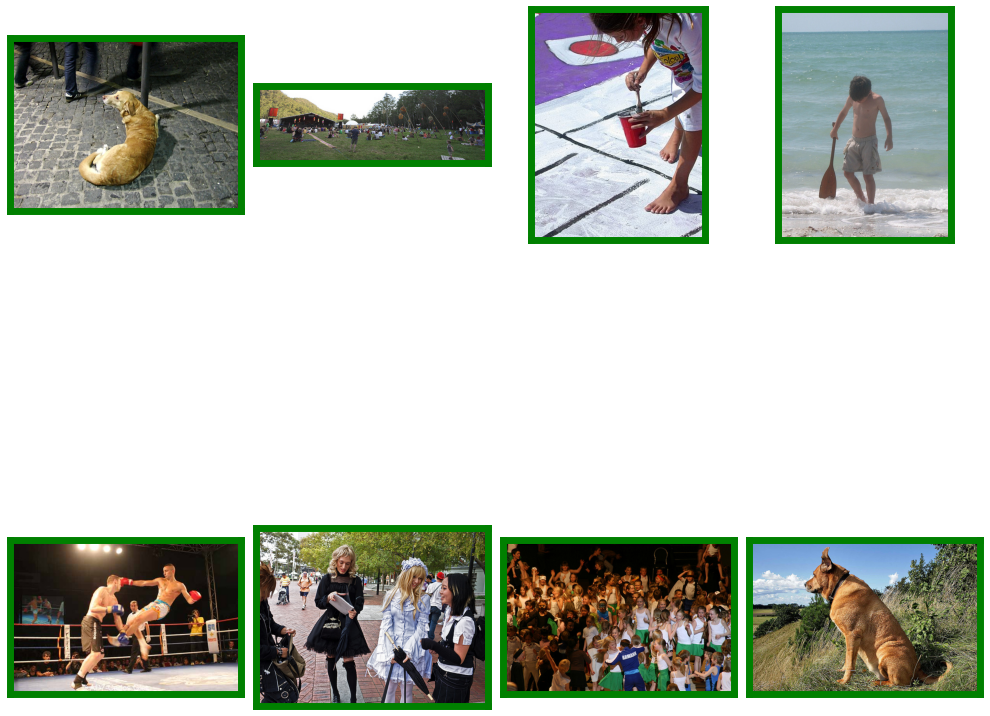

In [ ]:
samples_train = list(df_train['image'].sample(4))
samples_test = list(df_queries['image'].sample(4))

fig = plt.figure(figsize=(10,10))
for i in range(4):
    fig.add_subplot(4, 4, i+1)
    image = Image.open(Path(PATH,'train_images',samples_train[i]))
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
for i in range(4):
    fig.add_subplot(4, 4, i+9)
    image = Image.open(Path(PATH,'test_images', samples_test[i]))
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()

### Вывод

У нас имеются изображения с описаниями (1000 для обучения и 100 для теста), пропусков информации нет, к каждой картинке у нас имеется несколько описаний

### Агрегация оценок

В датафрейме df_expert у нас хранится информация от оценок экспертов, так как имеется 3 эксперта, а нам нужно выбрать 1 итоговую оценку, то оценки экспертов будем агрегировать. Если все оценки совпадают или большинство экспертов ставят одну и такую же оценку, то ставим ее, если эксперты ставят разные оценки то ставим среднюю оценку

In [ ]:
df_expert['expert_score'] = -100000000000000000
for i in range(len(df_expert)):
  if (df_expert['1'][i] == df_expert['1.1'][i] == df_expert['1.2'][i]) or (df_expert['1'][i] == df_expert['1.1'][i]) or (df_expert['1'][i] == df_expert['1.2'][i]):
    df_expert['expert_score'][i] = df_expert['1'][i]
  elif (df_expert['1.1'][i] == df_expert['1.2'][i]):
    df_expert['expert_score'][i] = df_expert['1.1'][i]
  else:
    df_expert['expert_score'][i] = (df_expert['1'][i] + df_expert['1.1'][i] + df_expert['1.2'][i])/3

for i in range(len(df_expert)):
  df_expert['expert_score'][i] = (df_expert['expert_score'][i]-1)/3 #Уменьшаем на 1 так как счет начинается с 1 и заканчивается 4 и при делаении если экспертное решение было 1 то станет 0 и вероятность
  # соответсвия будет 0, а при 4 станет 3 и вероятность будет 1

In [ ]:
display(df_expert.head())
#Проверка все ли значения были заполнены
df_expert['expert_score'].min()

,image,query_id,1,1.1,1.2,expert_score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1,0.000000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2,0.000000
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2,0.000000
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2,0.333333
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2,0.000000


0.0

Так как есть еще и оценки не экспертов, то соединим таблицы с их оценками с оценками экспертов и будем также использовать и их (при этом оценки экспертов будут приоритетнее)

In [ ]:
df_scores = pd.merge(df_expert, df_crowd, how='outer', on=['image', 'query_id'])

In [ ]:
df_scores

,image,query_id,1,1.1,1.2,expert_score,share_pos,count_pos,count_neg
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1.0,1.0,1.0,0.000000,0.000000,0.0,3.0
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1.0,1.0,2.0,0.000000,0.000000,0.0,3.0
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1.0,1.0,2.0,0.000000,NaN,NaN,NaN
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1.0,2.0,2.0,0.333333,NaN,NaN,NaN
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1.0,1.0,2.0,0.000000,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
51318,997722733_0cb5439472.jpg,543007912_23fc735b99.jpg#2,NaN,NaN,NaN,NaN,0.000000,0.0,3.0
51319,997722733_0cb5439472.jpg,544576742_283b65fa0d.jpg#2,NaN,NaN,NaN,NaN,0.333333,1.0,2.0
51320,997722733_0cb5439472.jpg,872622575_ba1d3632cc.jpg#2,NaN,NaN,NaN,NaN,1.000000,3.0,0.0
51321,997722733_0cb5439472.jpg,888425986_e4b6c12324.jpg#2,NaN,NaN,NaN,NaN,0.000000,0.0,3.0


Как мы можем видеть не у всех описаний есть оценка экспертов, в этом случае будем использовать оценку с краудсорсинга. В случае если у нас есть и экспертная оценка и оценка с краудсорсинга, то будем брать оценки экспертов с коэффициентом 0.6, а оценки людей с 0.4. Также приведем эти оценки к [0,1]

In [ ]:
df_scores['score'] = -1000000000000000000000000
for i in range(len(df_scores)):
  if np.isnan(df_scores['expert_score'][i]):
    df_scores['score'][i] = df_scores['share_pos'][i]
  elif np.isnan(df_scores['share_pos'][i]):
    df_scores['score'][i] = df_scores['expert_score'][i]
  else:
    df_scores['score'][i] = df_scores['expert_score'][i] * 0.6 + df_scores['share_pos'][i] * 0.4

df_scores['score'] = df_scores['score'].astype(float)


In [ ]:
#проверка работы
df_scores.describe()

,1,1.1,1.2,expert_score,share_pos,count_pos,count_neg,score
count,5822.000000,5822.000000,5822.000000,5822.000000,47830.000000,47830.000000,47830.000000,51323.000000
mean,1.436620,1.624356,1.881999,0.208157,0.068786,0.208488,2.820155,0.075049
std,0.787084,0.856222,0.904087,0.285431,0.207532,0.628898,0.656676,0.207266
min,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,3.000000,0.000000
50%,1.000000,1.000000,2.000000,0.000000,0.000000,0.000000,3.000000,0.000000
75%,2.000000,2.000000,2.000000,0.333333,0.000000,0.000000,3.000000,0.000000
max,4.000000,4.000000,4.000000,1.000000,1.000000,5.000000,6.000000,1.000000


In [ ]:
#Присоеденим оценки к датасету для обучения
print(df_train.info())
df_train = pd.merge(df_train, df_scores[['image', 'query_id', 'score']], how='outer', on=['image', 'query_id'])
print(df_train.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB
None
<class 'pandas.core.frame.DataFrame'>
Int64Index: 51323 entries, 0 to 51322
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       51323 non-null  object 
 1   query_id    51323 non-null  object 
 2   query_text  5822 non-null   object 
 3   score       51323 non-null  float64
dtypes: float64(1), object(3)
memory usage: 2.0+ MB
None


In [ ]:
#Добавим недостающие описания
to_fill = df_train[df_train['query_text'].notna()]

for i in range(len(df_train)):
  if pd.isnull(df_train['query_text'][i]):
    texts = to_fill[to_fill['query_id'] == df_train['query_id'][i]]['query_text']
    if len(texts)>0:
      df_train['query_text'][i] = texts.iloc[0]

In [ ]:
print(df_train.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 51323 entries, 0 to 51322
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       51323 non-null  object 
 1   query_id    51323 non-null  object 
 2   query_text  50214 non-null  object 
 3   score       51323 non-null  float64
dtypes: float64(1), object(3)
memory usage: 4.0+ MB
None


Мы видим, что после проведенных манипуляций не везде имеется описание, такие данные будут удалены

In [ ]:
df_train.dropna(inplace=True)
print(df_train.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 50214 entries, 0 to 51322
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       50214 non-null  object 
 1   query_id    50214 non-null  object 
 2   query_text  50214 non-null  object 
 3   score       50214 non-null  float64
dtypes: float64(1), object(3)
memory usage: 1.9+ MB
None


Итог:
Оценки были проагрегированы и приведены к вероятностям от 0 до 1

## 2 Проверка данных

В некоторых странах, где работает компания, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.

В сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

> This image is unavailable in your country in compliance with local laws
>

Однако у нас нет возможности воспользоваться данным функционалом. Поэтому все изображения, которые нарушают данный закон, нужно удалить из обучающей выборки.

Для решения данной проблемы мы в начале отметим фото в которых по описанию имеются слова ребенок, подросток, девочка, мальчик и тд, а затем удалим их

In [ ]:
lemmatize = nltk.WordNetLemmatizer()
children_words = ['baby', 'girl', 'boy', 'kid','child','teenage','teenager']

def get_lemmas(text) -> list:

    text = re.sub('[^a-zA-Z]', ' ', text).lower() # удаляем неалфавитные символы, приводим к нижнему регистру
    text = nltk.word_tokenize(text, language = 'english') # токенизируем слова
    text = [lemmatize.lemmatize(word) for word in text] # лемматирзируем слова

    return text

def cleaning(row) -> object:


    text = get_lemmas(row['query_text'])
    if [i for i in text if i in children_words]:
        row['children'] = 1
    else:
        row['children'] = 0

    return row

In [ ]:
df_train = df_train.apply(cleaning, axis=1)

In [ ]:
df_train

,image,query_id,query_text,score,children
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000,1
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000,1
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.200000,1
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1.000000,1
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000,1
...,...,...,...,...,...
51318,997722733_0cb5439472.jpg,543007912_23fc735b99.jpg#2,Two girls with orange shirts .,0.000000,1
51319,997722733_0cb5439472.jpg,544576742_283b65fa0d.jpg#2,A woman in jeans rock climbing .,0.333333,0
51320,997722733_0cb5439472.jpg,872622575_ba1d3632cc.jpg#2,A man is climbing the side of a mountain .,1.000000,0
51321,997722733_0cb5439472.jpg,888425986_e4b6c12324.jpg#2,A person flipping upside down,0.000000,0


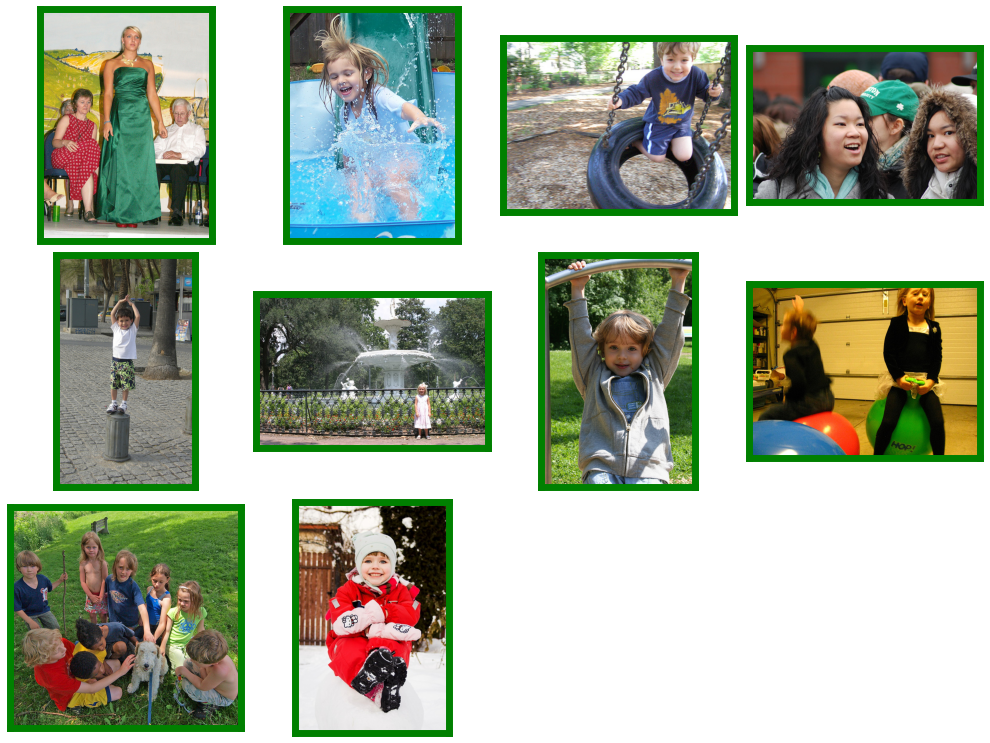

In [ ]:
children_photo = list(df_train[df_train['children'] == 1]['query_id'].sample(10))
children_photo = [i[:-2] for i in children_photo]

fig = plt.figure(figsize=(10,10))
for i in range(10):
    fig.add_subplot(4, 4, i+1)
    image = Image.open(Path(PATH, 'train_images', children_photo[i]))
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()

Исходя из тестовой и визуальной проверки алгоритм сработал правильно и отметил фото на которых имеются дети

In [ ]:
df_train.drop(df_train[df_train['children'] == 1].index, inplace=True, errors='ignore') #Удаление строк где есть дети
df_train.describe()

,score,children
count,36125.000000,36125.0
mean,0.085400,0.0
std,0.219792,0.0
min,0.000000,0.0
25%,0.000000,0.0
50%,0.000000,0.0
75%,0.000000,0.0
max,1.000000,0.0


In [ ]:
df_train.drop(columns='children', inplace=True, errors='ignore') #Удаление столбца обозначавшего есть ребенок на фото или нет
df_train.reset_index(inplace=True, drop=True) #Новое проставление индексов


In [ ]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36125 entries, 0 to 36124
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       36125 non-null  object 
 1   query_id    36125 non-null  object 
 2   query_text  36125 non-null  object 
 3   score       36125 non-null  float64
dtypes: float64(1), object(3)
memory usage: 1.1+ MB


## 3 Векторизация изображений

Перейдём к векторизации изображений.

Самый примитивный способ — прочесть изображение и превратить полученную матрицу в вектор. Такой способ нам не подходит: длина векторов может быть сильно разной, так как размеры изображений разные. Поэтому стоит обратиться к свёрточным сетям: они позволяют "выделить" главные компоненты изображений. Как это сделать? Нужно выбрать какую-либо архитектуру, например ResNet-18, посмотреть на слои и исключить полносвязные слои, которые отвечают за конечное предсказание. При этом можно загрузить модель данной архитектуры, предварительно натренированную на датасете ImageNet.

In [ ]:
train_datagen = ImageDataGenerator(rescale=1/255.)
train_gen_flow = train_datagen.flow_from_dataframe(
        dataframe=df_train,
        directory=Path(PATH, 'train_images'),
        x_col='image',
        y_col='score',
        target_size=(224, 224),
        batch_size=16,
        class_mode='input',
        seed=32145)

Found 36125 validated image filenames.


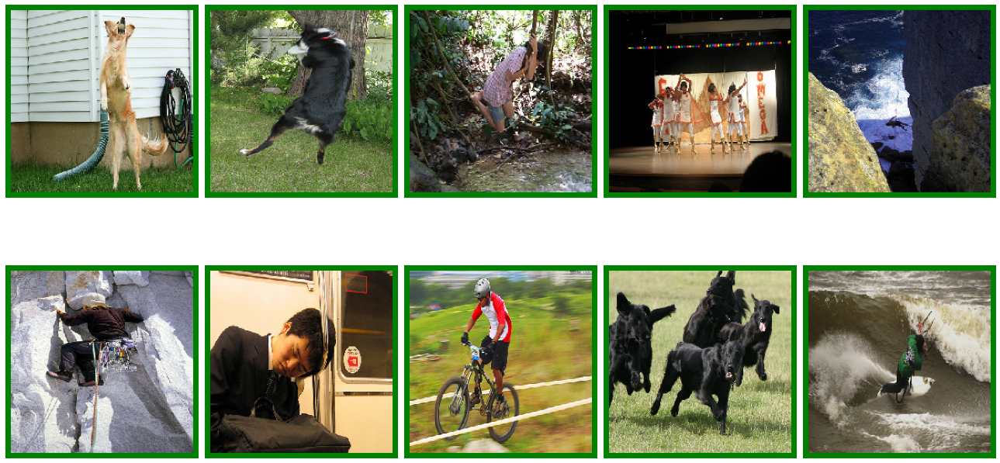

In [ ]:
features, target = next(train_gen_flow)

fig = plt.figure(figsize=(13,10))
for i in range(10):
    fig.add_subplot(2, 5, i+1)
    plt.imshow(features[i])
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
plt.show()

In [ ]:
backbone = ResNet50(input_shape=(224, 224, 3),
                        weights='imagenet',
                        include_top=False)
model = Sequential()
model.add(backbone)
model.add(GlobalAveragePooling2D())
optimizer = Adam(learning_rate=1e-3)
model.compile(optimizer=optimizer, loss='mean_squared_error',
              metrics=['mean_absolute_error'])

In [ ]:
predictions = model.predict(train_gen_flow)

2258/2258 [==============================] - 350s 155ms/step


In [ ]:
predictions.shape

(36125, 2048)

## 4 Векторизация текстов

Следующий этап — векторизация текстов. Для векторизации будем использовать Bert


In [ ]:
bert = keras_nlp.models.BertBackbone.from_preset('bert_base_en')

In [ ]:
preprocessor = keras_nlp.models.BertPreprocessor.from_preset('bert_base_en')

In [ ]:
def vectorize_text(model, data, preprocessor=preprocessor, batch_size=32, bar=True, verbose=0) -> np.array:


    embeddings = []
    tokenized = preprocessor(data)

    if bar:
        for i in notebook.tqdm(range(tokenized['token_ids'].shape[0] // batch_size + 1)):

            tokens = tokenized['token_ids'][batch_size*i:batch_size*(i+1)]
            token_types = tokenized['segment_ids'][batch_size*i:batch_size*(i+1)]
            mask = tokenized['padding_mask'][batch_size*i:batch_size*(i+1)]

            batch = {'token_ids' : tokens,
                    'segment_ids' : token_types,
                    'padding_mask' : mask}

            batch_embeddings = model.predict(batch, verbose=verbose)

            embeddings.append(batch_embeddings['pooled_output'])

    else:
        for i in range(tokenized['token_ids'].shape[0] // batch_size + 1):

            tokens = tokenized['token_ids'][batch_size*i:batch_size*(i+1)]
            token_types = tokenized['segment_ids'][batch_size*i:batch_size*(i+1)]
            mask = tokenized['padding_mask'][batch_size*i:batch_size*(i+1)]

            batch = {'token_ids' : tokens,
                    'segment_ids' : token_types,
                    'padding_mask' : mask}

            batch_embeddings = model.predict(batch, verbose=verbose)

            embeddings.append(batch_embeddings['pooled_output'])

    return np.concatenate(embeddings)

In [ ]:
text = list(df_train['query_text'])

In [ ]:
text_embeds = vectorize_text(model=bert, data=text)

  0%|          | 0/1129 [00:00<?, ?it/s]

In [ ]:
text_embeds.shape

(36125, 768)

## 5 Объединение векторов

In [ ]:
features = np.concatenate((predictions, text_embeds), axis=1)
features.shape

(36125, 2816)

In [ ]:
target = np.array(df_train['score'])
target.shape

(36125,)

## 6 Обучение модели предсказания соответствия

In [ ]:
gss = GroupShuffleSplit(n_splits=1, train_size=.8, random_state=42)
train_indices, test_indices = next(gss.split(X=features, y=target, groups=df_train['image']))
features_train, features_test = features[train_indices], features[test_indices]
target_train, target_test = target[train_indices], target[test_indices]

In [ ]:
scaler = StandardScaler().fit(features_train) #Масштабирование данных
features_train = scaler.transform(features_train)
features_test = scaler.transform(features_test)

In [ ]:
features_train.shape


(28870, 2816)

При проверках моделей на качетсво обучения будем использовать метрику RMSE, так как он позволит нам видеть насколько далеко модель от правильного ответа, при этом RMSE будет лучше реагировать на выбросы чем MSE

### Модель LinearRegression

In [ ]:
model = LinearRegression(n_jobs=-1)
model.fit(features_train, target_train)
score = cross_val_score(
    model, features_train, target_train, groups=df_train['image'].loc[train_indices],
    scoring='neg_root_mean_squared_error', cv=GroupShuffleSplit(random_state=12345) ).mean()
score

-0.22321302982563435

In [ ]:
pred = model.predict(features_test)
mean_squared_error(pred, target_test, squared=False)

0.20849298740221772

### Модель нейронной сети

In [ ]:
NN = Sequential()
NN.add(Dense(2816, input_shape=(2816,), activation='relu'))
NN.add(BatchNormalization())
NN.add(Dense(256, activation='relu'))
NN.add(BatchNormalization())
NN.add(Dense(1, activation='relu'))

optimizer = Adam(learning_rate=1e-6)

NN.compile(optimizer=optimizer, loss='mean_squared_error',
            metrics=[tf.keras.metrics.RootMeanSquaredError()])


In [ ]:
NN.fit(
    features_train, target_train,
    validation_data=(features_test, target_test),
    batch_size=40, epochs=25,
    verbose=2, shuffle=True
    )

Epoch 1/25
722/722 - 8s - loss: 0.4131 - root_mean_squared_error: 0.6428 - val_loss: 0.2541 - val_root_mean_squared_error: 0.5041 - 8s/epoch - 11ms/step
Epoch 2/25
722/722 - 4s - loss: 0.2559 - root_mean_squared_error: 0.5058 - val_loss: 0.1860 - val_root_mean_squared_error: 0.4313 - 4s/epoch - 5ms/step
Epoch 3/25
722/722 - 4s - loss: 0.2051 - root_mean_squared_error: 0.4529 - val_loss: 0.1482 - val_root_mean_squared_error: 0.3850 - 4s/epoch - 6ms/step
Epoch 4/25
722/722 - 5s - loss: 0.1747 - root_mean_squared_error: 0.4179 - val_loss: 0.1342 - val_root_mean_squared_error: 0.3663 - 5s/epoch - 7ms/step
Epoch 5/25
722/722 - 4s - loss: 0.1564 - root_mean_squared_error: 0.3955 - val_loss: 0.1213 - val_root_mean_squared_error: 0.3483 - 4s/epoch - 6ms/step
Epoch 6/25
722/722 - 4s - loss: 0.1367 - root_mean_squared_error: 0.3697 - val_loss: 0.1079 - val_root_mean_squared_error: 0.3284 - 4s/epoch - 6ms/step
Epoch 7/25
722/722 - 5s - loss: 0.1238 - root_mean_squared_error: 0.3519 - val_loss: 0.

## 7 Тестирование модели

Для тестирования будем использовать модель нейронной сети

In [ ]:
test_datagen = ImageDataGenerator(rescale=1/255.)
test_gen_flow = test_datagen.flow_from_dataframe(
        dataframe=df_images,
        directory=Path(PATH, 'test_images'),
        x_col='image',
        y_col=None,
        target_size=(224, 224),
        batch_size=16,
        class_mode='input',
        seed=1235)

Found 100 validated image filenames.


In [ ]:
backbone = ResNet50(input_shape=(224, 224, 3),
                        weights='imagenet',
                        include_top=False)
model = Sequential()
model.add(backbone)
model.add(GlobalAveragePooling2D())
optimizer = Adam(learning_rate=1e-3)
model.compile(optimizer=optimizer, loss='mean_squared_error',
              metrics=['mean_absolute_error'])

In [ ]:
pict_embeds_test = model.predict(test_gen_flow)
pict_embeds_test.shape

7/7 [==============================] - 2s 138ms/step


(100, 2048)

In [ ]:
def get_picture(text) -> None:


    if [i for i in get_lemmas(text) if i in children_words]: #проверяем есть ли запрещенные изображения
        print('This image is unavailable in your country in compliance with local laws.')
    else:
        text_embed = vectorize_text(model=bert, data=[text], bar=False)
        X = np.concatenate((
            pict_embeds_test,
            np.resize(text_embed, (pict_embeds_test.shape[0],768))),
            axis=1)
        X = scaler.transform(X)
        predictions = NN.predict(X) #получаем предсказания оценок экспертов
        df = pd.concat((df_images, pd.Series(np.reshape(predictions, (predictions.shape[0],)), name='pred')), axis=1) #добавляем оценки к номерам картинок
        top = list(df.sort_values(by='pred', ascending=False)['image'].head(5)) #получили топ 5 имён файлов с картинками
        top_score = list(df.sort_values(by='pred', ascending=False)['pred'].head(5)) #получили топ 5 оценок

        print('')
        print('-' * 20, text, '-' * 20)
        print('')

        fig = plt.figure(figsize=(15,5)) #выводим на экран 5 наиболее похожих картинок
        plt.rcParams['axes.edgecolor'] = 'black'
        plt.rcParams['axes.linewidth'] = 0
        for i in range(5):
            fig.add_subplot(1, 6, i+1, title=round(top_score[i], 2))
            image = Image.open(Path(PATH, 'test_images', top[i]))
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()

        if text in list(df_queries['query_text']): #если текст был в исходном файле с описаниями - добавляем оригинальную картинку
            plt.rcParams['axes.edgecolor'] = 'green'
            plt.rcParams['axes.linewidth'] = 5
            fig.add_subplot(1, 6, 6)
            image = Image.open(Path(PATH, 'test_images', df_queries.iloc[df_queries[df_queries['query_text'] == text].index[0]]['image']))
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()

        plt.show()

    return None

In [ ]:
samples = df_queries.sample(10)
text_test = list(samples['query_text'])
text_test

['Little boy standing on the bank of a river .',
 'A dog jumping off a dock into a pool of water .',
 'A little kid splashes around in the kiddie pool while a lady watches .',
 'A little girls waist high in sand',
 'a brown and white dog standing on the street wearing a hat , shirt and jeans .',
 'A black and white dog jumping out of the water and a brown dog shaking off .',
 'a snowboarder wearing red is descending a snow covered mountain .',
 'A large dog and a small one walk with their toys .',
 'Man in field with a black dog jumping at his raised arm .',
 'A group of people are ice skating in a big city .']

This image is unavailable in your country in compliance with local laws.
4/4 [==============================] - 0s 4ms/step

-------------------- A dog jumping off a dock into a pool of water . --------------------



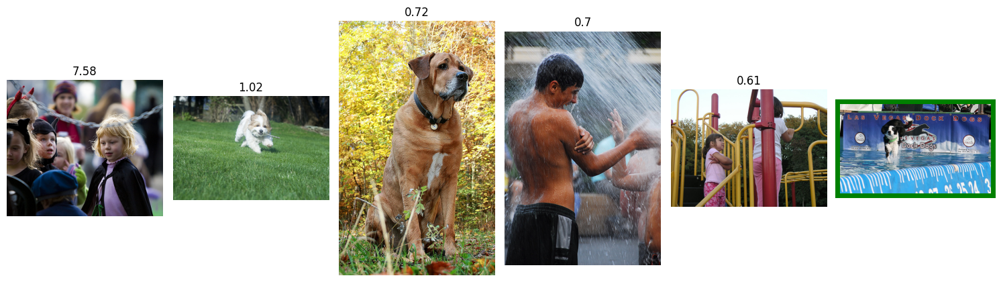

This image is unavailable in your country in compliance with local laws.
This image is unavailable in your country in compliance with local laws.
4/4 [==============================] - 0s 6ms/step

-------------------- a brown and white dog standing on the street wearing a hat , shirt and jeans . --------------------



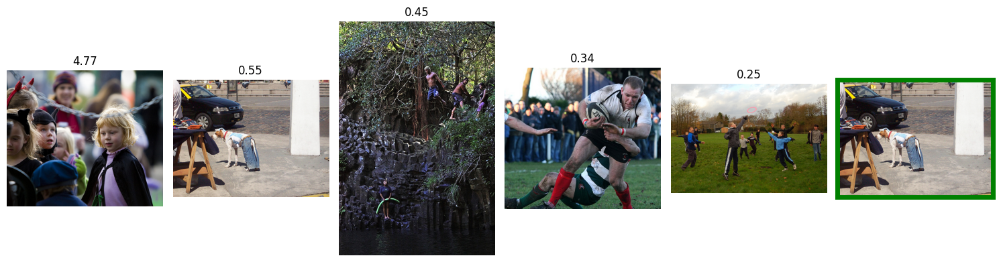

4/4 [==============================] - 0s 6ms/step

-------------------- A black and white dog jumping out of the water and a brown dog shaking off . --------------------



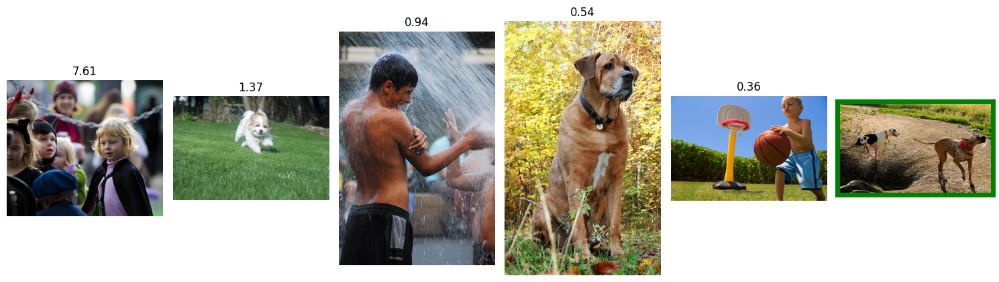

4/4 [==============================] - 0s 8ms/step

-------------------- a snowboarder wearing red is descending a snow covered mountain . --------------------



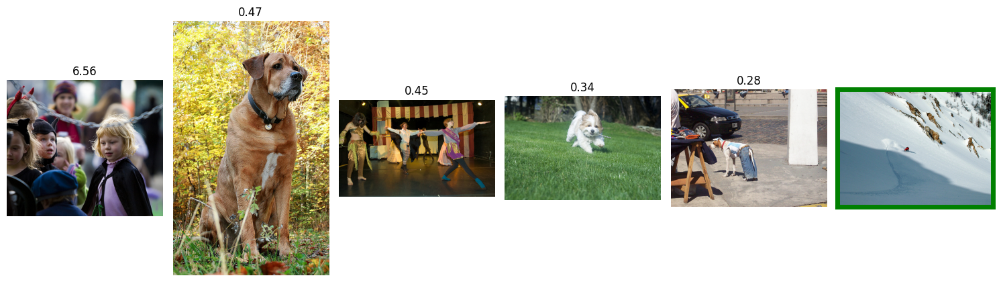

4/4 [==============================] - 0s 6ms/step

-------------------- A large dog and a small one walk with their toys . --------------------



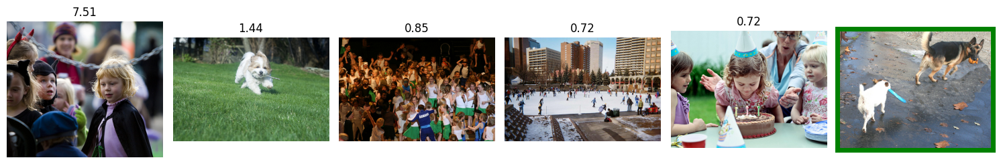

4/4 [==============================] - 0s 6ms/step

-------------------- Man in field with a black dog jumping at his raised arm . --------------------



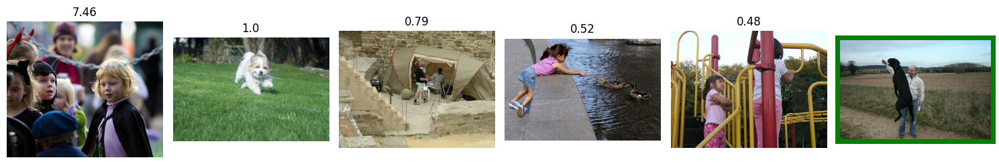

4/4 [==============================] - 0s 8ms/step

-------------------- A group of people are ice skating in a big city . --------------------



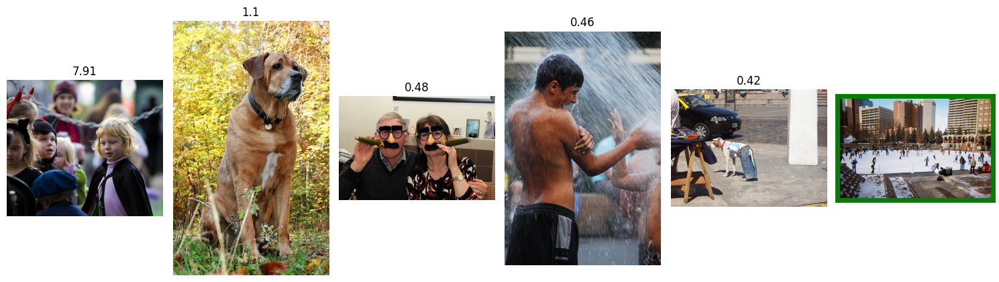

In [ ]:
for text in text_test:
    get_picture(text)

## Вывод:

В данной работе мы делали модель, которая по указанному описанию соотносила бы изображения.
В работе мы использовали 2 модели:
- LinearRegression
- Нейронная сеть ResNet50

В качестве метрики была выбрана метрика RMSE. Качество предсказания оказалось не велико. Скорее всего это связано с маленьким объемом данных или плохим выбором моделей.